<a href="https://colab.research.google.com/github/Siddhi-Takawade/NLP-Consumer-complaints/blob/main/BERTopic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Topic Modeling with BERTopic


we will be exploring how to use BERTopic to create topics from the consumer complaints dataset. The most frequent use-cases and methods are discussed together with important parameters to keep a look out for. 


## BERTopic
BERTopic is a topic modeling technique that leverages transformers and a custom class-based TF-IDF to create dense clusters allowing for easily interpretable topics whilst keeping important words in the topic descriptions. 

# Enabling the GPU

First, you'll need to enable GPUs for the notebook:

- Navigate to Edit→Notebook Settings
- select GPU from the Hardware Accelerator drop-down

[Reference](https://colab.research.google.com/notebooks/gpu.ipynb)

# **Installing BERTopic**

We start by installing BERTopic from PyPi:

Installation can take a while

In [ ]:
%%capture
!pip install bertopic

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Restart the Notebook

(Mandatory)


After installing BERTopic, some packages that were already loaded were updated and in order to correctly use them, we should now restart the notebook.

From the Menu:

Runtime → Restart Runtime

# Data
This is the Finance Insurance dataset which contains roughly 24k complaints of the top 10 companies like LIC, ICICI, Reliance, Bajaj Allianz, TATA and more

In [2]:
import pandas as pd
df = pd.read_csv("/content/drive/MyDrive/Copy of bsnl_merged_cleaned.csv")

In [3]:
df.head(3)

,Unnamed: 0,web-scraper-order,web-scraper-start-url,compl_title,link_title-href,comp_detail,update_date,comp_status_text,username,comp_date,comp_location,comp_status,City,State,title,Company Name,complaint_date_changed,Update_date_changed
0,0,1623825574-391,https://www.consumercomplaints.in/bharat-sanch...,BSNL Dataone —\nbroadband connecting problem,https://www.consumercomplaints.in/complaints/b...,hai\n\niam using broad band services since one...,NaN,NaN,chintala srinivas rao,NaN,"Vellore, Tamil Nadu",Not Resolved,Vellore,Tamil Nadu,broadband connecting problem,BSNL Dataone,NaN,NaN
1,1,1623847234-5990,https://www.consumercomplaints.in/bharat-sanch...,Bharat Sanchar Nigam [BSNL] —\ndata service in...,https://www.consumercomplaints.in/bharat-sanch...,I recharged with 429 rupee plan for 3.2 gb per...,"Oct 08, 2019",Bharat Sanchar Nigam [BSNL] customer support h...,its GauRAV,"Oct 8, 2019","Mathura, Uttar Pradesh",Not Resolved,Mathura,Uttar Pradesh,data service in bsnl 3g sim,Bharat Sanchar Nigam [BSNL],08-10-2019,08-10-2019
2,2,1623841539-4219,https://www.consumercomplaints.in/bharat-sanch...,BSNL —\nMore than 3 times I received the chann...,https://www.consumercomplaints.in/bsnl-more-th...,More than 3 times I received the channel renew...,"Mar 19, 2014",Bharat Sanchar Nigam [BSNL] customer support h...,megh_prince,NaN,"Mumbai, Maharashtra",Not Resolved,Mumbai,Maharashtra,More than 3 times I received the channel renew...,BSNL,NaN,19-03-2014


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14598 entries, 0 to 14597
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Unnamed: 0              14598 non-null  int64 
 1   web-scraper-order       14598 non-null  object
 2   web-scraper-start-url   14598 non-null  object
 3   compl_title             14598 non-null  object
 4   link_title-href         6640 non-null   object
 5   comp_detail             14598 non-null  object
 6   update_date             11473 non-null  object
 7   comp_status_text        5960 non-null   object
 8   username                14598 non-null  object
 9   comp_date               4596 non-null   object
 10  comp_location           13064 non-null  object
 11  comp_status             14598 non-null  object
 12  City                    13064 non-null  object
 13  State                   13064 non-null  object
 14  title                   14598 non-null  object
 15  Co

In [7]:
df["comp_detail"]

0        hai\n\niam using broad band services since one...
1        I recharged with 429 rupee plan for 3.2 gb per...
2        More than 3 times I received the channel renew...
3        i am getting my user name/password as invalid ...
4        my name is myrna pereira and my number is[prot...
                               ...                        
14593    I am a Post Paid customer of BSNL. My Mobile N...
14594    Humne bahut bar bsnl 198 par compaint ki hai, ...
14595    Dear sir , iam a bsnl landline subscriber actu...
14596    respected sir, \n\ni have postpaid connection ...
14597    My land line telephone(Tel. No-[protected]) is...
Name: comp_detail, Length: 14598, dtype: object

## Preprocessing with Texthero


In [8]:
%%capture
!pip install texthero 

In [9]:
import texthero as hero

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


### Cleaning the data

In [11]:
from texthero import preprocessing
custom_pipeline = [preprocessing.fillna,
                   preprocessing.lowercase,
                   preprocessing.remove_digits,
                   preprocessing.remove_punctuation,
                   preprocessing.remove_diacritics,
                   preprocessing.remove_stopwords,
                   preprocessing.remove_whitespace,
                   preprocessing.stem]
df["cleaned_complaint_body"] = hero.clean(df["comp_detail"], pipeline = custom_pipeline)
df.head()

,Unnamed: 0,web-scraper-order,web-scraper-start-url,compl_title,link_title-href,comp_detail,update_date,comp_status_text,username,comp_date,comp_location,comp_status,City,State,title,Company Name,complaint_date_changed,Update_date_changed,cleaned_complaint_body
0,0,1623825574-391,https://www.consumercomplaints.in/bharat-sanch...,BSNL Dataone —\nbroadband connecting problem,https://www.consumercomplaints.in/complaints/b...,hai\n\niam using broad band services since one...,NaN,NaN,chintala srinivas rao,NaN,"Vellore, Tamil Nadu",Not Resolved,Vellore,Tamil Nadu,broadband connecting problem,BSNL Dataone,NaN,NaN,hai iam use broad band servic sinc one half ye...
1,1,1623847234-5990,https://www.consumercomplaints.in/bharat-sanch...,Bharat Sanchar Nigam [BSNL] —\ndata service in...,https://www.consumercomplaints.in/bharat-sanch...,I recharged with 429 rupee plan for 3.2 gb per...,"Oct 08, 2019",Bharat Sanchar Nigam [BSNL] customer support h...,its GauRAV,"Oct 8, 2019","Mathura, Uttar Pradesh",Not Resolved,Mathura,Uttar Pradesh,data service in bsnl 3g sim,Bharat Sanchar Nigam [BSNL],08-10-2019,08-10-2019,recharg rupe plan gb per day septemb octob get...
2,2,1623841539-4219,https://www.consumercomplaints.in/bharat-sanch...,BSNL —\nMore than 3 times I received the chann...,https://www.consumercomplaints.in/bsnl-more-th...,More than 3 times I received the channel renew...,"Mar 19, 2014",Bharat Sanchar Nigam [BSNL] customer support h...,megh_prince,NaN,"Mumbai, Maharashtra",Not Resolved,Mumbai,Maharashtra,More than 3 times I received the channel renew...,BSNL,NaN,19-03-2014,time receiv channel renew sms send bsnl protec...
3,3,1623825533-376,https://www.consumercomplaints.in/bharat-sanch...,BSNL Broadband —\nNOT GETTING USAGE DETAILS,https://www.consumercomplaints.in/complaints/b...,i am getting my user name/password as invalid ...,"Aug 14, 2020",NaN,Abhishek kumar,NaN,"Sikar, Rajasthan",[Resolved],Sikar,Rajasthan,NOT GETTING USAGE DETAILS,BSNL Broadband,NaN,14-08-2020,get user name password invalid although type c...
4,4,1623834784-2028,https://www.consumercomplaints.in/bharat-sanch...,BSNL Games on Demand —\ndeactivate programme,https://www.consumercomplaints.in/complaints/b...,my name is myrna pereira and my number is[prot...,"Aug 13, 2020",NaN,myrnapereira,NaN,"Chennai, Tamil Nadu",[Resolved],Chennai,Tamil Nadu,deactivate programme,BSNL Games on Demand,NaN,13-08-2020,name myrna pereira number protect call said pr...


Specifying addtitional stopwords

In [12]:
from texthero import stopwords

stopwords_additional = ["pleas","protect","0o", "0s", "3a", "3b", "3d", "6b", "6o", "a", "a1", "a2", "a3", "a4", "ab", "able", "about", "above", "abst", "ac", "accordance", "according", "accordingly", "across", "act", "actually", "ad", "added", "adj", "ae", "af", "affected", "affecting", "affects", "after", "afterwards", "ag", "again", "against", "ah", "ain", "ain't", "aj", "al", "all", "allow", "allows", "almost", "alone", "along", "already", "also", "although", "always", "am", "among", "amongst", "amoungst", "amount", "an", "and", "announce", "another", "any", "anybody", "anyhow", "anymore", "anyone", "anything", "anyway", "anyways", "anywhere", "ao", "ap", "apart", "apparently", "appear", "appreciate", "appropriate", "approximately", "ar", "are", "aren", "arent", "aren't", "arise", "around", "as", "a's", "aside", "ask", "asking", "associated", "at", "au", "auth", "av", "available", "aw", "away", "awfully", "ax", "ay", "az", "b", "b1", "b2", "b3", "ba", "back", "bc", "bd", "be", "became", "because", "become", "becomes", "becoming", "been", "before", "beforehand", "begin", "beginning", "beginnings", "begins", "behind", "being", "believe", "below", "beside", "besides", "best", "better", "between", "beyond", "bi", "bill", "biol", "bj", "bk", "bl", "bn", "both", "bottom", "bp", "br", "brief", "briefly", "bs", "bt", "bu", "but", "bx", "by", "c", "c1", "c2", "c3", "ca", "call", "came", "can", "cannot", "cant", "can't", "cause", "causes", "cc", "cd", "ce", "certain", "certainly", "cf", "cg", "ch", "changes", "ci", "cit", "cj", "cl", "clearly", "cm", "c'mon", "cn", "co", "com", "come", "comes", "con", "concerning", "consequently", "consider", "considering", "contain", "containing", "contains", "corresponding", "could", "couldn", "couldnt", "couldn't", "course", "cp", "cq", "cr", "cry", "cs", "c's", "ct", "cu", "currently", "cv", "cx", "cy", "cz", "d", "d2", "da", "date", "dc", "dd", "de", "definitely", "describe", "described", "despite", "detail", "df", "di", "did", "didn", "didn't", "different", "dj", "dk", "dl", "do", "does", "doesn", "doesn't", "doing", "don", "done", "don't", "down", "downwards", "dp", "dr", "ds", "dt", "du", "due", "during", "dx", "dy", "e", "e2", "e3", "ea", "each", "ec", "ed", "edu", "ee", "ef", "effect", "eg", "ei", "eight", "eighty", "either", "ej", "el", "eleven", "else", "elsewhere", "em", "empty", "en", "end", "ending", "enough", "entirely", "eo", "ep", "eq", "er", "es", "especially", "est", "et", "et-al", "etc", "eu", "ev", "even", "ever", "every", "everybody", "everyone", "everything", "everywhere", "ex", "exactly", "example", "except", "ey", "f", "f2", "fa", "far", "fc", "few", "ff", "fi", "fifteen", "fifth", "fify", "fill", "find", "fire", "first", "five", "fix", "fj", "fl", "fn", "fo", "followed", "following", "follows", "for", "former", "formerly", "forth", "forty", "found", "four", "fr", "from", "front", "fs", "ft", "fu", "full", "further", "furthermore", "fy", "g", "ga", "gave", "ge", "get", "gets", "getting", "gi", "give", "given", "gives", "giving", "gj", "gl", "go", "goes", "going", "gone", "got", "gotten", "gr", "greetings", "gs", "gy", "h", "h2", "h3", "had", "hadn", "hadn't", "happens", "hardly", "has", "hasn", "hasnt", "hasn't", "have", "haven", "haven't", "having", "he", "hed", "he'd", "he'll", "hello", "help", "hence", "her", "here", "hereafter", "hereby", "herein", "heres", "here's", "hereupon", "hers", "herself", "hes", "he's", "hh", "hi", "hid", "him", "himself", "his", "hither", "hj", "ho", "home", "hopefully", "how", "howbeit", "however", "how's", "hr", "hs", "http", "hu", "hundred", "hy", "i", "i2", "i3", "i4", "i6", "i7", "i8", "ia", "ib", "ibid", "ic", "id", "i'd", "ie", "if", "ig", "ignored", "ih", "ii", "ij", "il", "i'll", "im", "i'm", "immediate", "immediately", "importance", "important", "in", "inasmuch", "inc", "indeed", "index", "indicate", "indicated", "indicates", "information", "inner", "insofar", "instead", "interest", "into", "invention", "inward", "io", "ip", "iq", "ir", "is", "isn", "isn't", "it", "itd", "it'd", "it'll", "its", "it's", "itself", "iv", "i've", "ix", "iy", "iz", "j", "jj", "jr", "js", "jt", "ju", "just", "k", "ke", "keep", "keeps", "kept", "kg", "kj", "km", "know", "known", "knows", "ko", "l", "l2", "la", "largely", "last", "lately", "later", "latter", "latterly", "lb", "lc", "le", "least", "les", "less", "lest", "let", "lets", "let's", "lf", "like", "liked", "likely", "line", "little", "lj", "ll", "ll", "ln", "lo", "look", "looking", "looks", "los", "lr", "ls", "lt", "ltd", "m", "m2", "ma", "made", "mainly", "make", "makes", "many", "may", "maybe", "me", "mean", "means", "meantime", "meanwhile", "merely", "mg", "might", "mightn", "mightn't", "mill", "million", "mine", "miss", "ml", "mn", "mo", "more", "moreover", "most", "mostly", "move", "mr", "mrs", "ms", "mt", "mu", "much", "mug", "must", "mustn", "mustn't", "my", "myself", "n", "n2", "na", "name", "namely", "nay", "nc", "nd", "ne", "near", "nearly", "necessarily", "necessary", "need", "needn", "needn't", "needs", "neither", "never", "nevertheless", "new", "next", "ng", "ni", "nine", "ninety", "nj", "nl", "nn", "no", "nobody", "non", "none", "nonetheless", "noone", "nor", "normally", "nos", "not", "noted", "nothing", "novel", "now", "nowhere", "nr", "ns", "nt", "ny", "o", "oa", "ob", "obtain", "obtained", "obviously", "oc", "od", "of", "off", "often", "og", "oh", "oi", "oj", "ok", "okay", "ol", "old", "om", "omitted", "on", "once", "one", "ones", "only", "onto", "oo", "op", "oq", "or", "ord", "os", "ot", "other", "others", "otherwise", "ou", "ought", "our", "ours", "ourselves", "out", "outside", "over", "overall", "ow", "owing", "own", "ox", "oz", "p", "p1", "p2", "p3", "page", "pagecount", "pages", "par", "part", "particular", "particularly", "pas", "past", "pc", "pd", "pe", "per", "perhaps", "pf", "ph", "pi", "pj", "pk", "pl", "placed", "please", "plus", "pm", "pn", "po", "poorly", "possible", "possibly", "potentially", "pp", "pq", "pr", "predominantly", "present", "presumably", "previously", "primarily", "probably", "promptly", "proud", "provides", "ps", "pt", "pu", "put", "py", "q", "qj", "qu", "que", "quickly", "quite", "qv", "r", "r2", "ra", "ran", "rather", "rc", "rd", "re", "readily", "really", "reasonably", "recent", "recently", "ref", "refs", "regarding", "regardless", "regards", "related", "relatively", "research", "research-articl", "respectively", "resulted", "resulting", "results", "rf", "rh", "ri", "right", "rj", "rl", "rm", "rn", "ro", "rq", "rr", "rs", "rt", "ru", "run", "rv", "ry", "s", "s2", "sa", "said", "same", "saw", "say", "saying", "says", "sc", "sd", "se", "sec", "second", "secondly", "section", "see", "seeing", "seem", "seemed", "seeming", "seems", "seen", "self", "selves", "sensible", "sent", "serious", "seriously", "seven", "several", "sf", "shall", "shan", "shan't", "she", "shed", "she'd", "she'll", "shes", "she's", "should", "shouldn", "shouldn't", "should've", "show", "showed", "shown", "showns", "shows", "si", "side", "significant", "significantly", "similar", "similarly", "since", "sincere", "six", "sixty", "sj", "sl", "slightly", "sm", "sn", "so", "some", "somebody", "somehow", "someone", "somethan", "something", "sometime", "sometimes", "somewhat", "somewhere", "soon", "sorry", "sp", "specifically", "specified", "specify", "specifying", "sq", "sr", "ss", "st", "still", "stop", "strongly", "sub", "substantially", "successfully", "such", "sufficiently", "suggest", "sup", "sure", "sy", "system", "sz", "t", "t1", "t2", "t3", "take", "taken", "taking", "tb", "tc", "td", "te", "tell", "ten", "tends", "tf", "th", "than", "thank", "thanks", "thanx", "that", "that'll", "thats", "that's", "that've", "the", "their", "theirs", "them", "themselves", "then", "thence", "there", "thereafter", "thereby", "thered", "therefore", "therein", "there'll", "thereof", "therere", "theres", "there's", "thereto", "thereupon", "there've", "these", "they", "theyd", "they'd", "they'll", "theyre", "they're", "they've", "thickv", "thin", "think", "third", "this", "thorough", "thoroughly", "those", "thou", "though", "thoughh", "thousand", "three", "throug", "through", "throughout", "thru", "thus", "ti", "til", "tip", "tj", "tl", "tm", "tn", "to", "together", "too", "took", "top", "toward", "towards", "tp", "tq", "tr", "tried", "tries", "truly", "try", "trying", "ts", "t's", "tt", "tv", "twelve", "twenty", "twice", "two", "tx", "u", "u201d", "ue", "ui", "uj", "uk", "um", "un", "under", "unfortunately", "unless", "unlike", "unlikely", "until", "unto", "uo", "up", "upon", "ups", "ur", "us", "use", "used", "useful", "usefully", "usefulness", "uses", "using", "usually", "ut", "v", "va", "value", "various", "vd", "ve", "ve", "very", "via", "viz", "vj", "vo", "vol", "vols", "volumtype", "vq", "vs", "vt", "vu", "w", "wa", "want", "wants", "was", "wasn", "wasnt", "wasn't", "way", "we", "wed", "we'd", "welcome", "well", "we'll", "well-b", "went", "were", "we're", "weren", "werent", "weren't", "we've", "what", "whatever", "what'll", "whats", "what's", "when", "whence", "whenever", "when's", "where", "whereafter", "whereas", "whereby", "wherein", "wheres", "where's", "whereupon", "wherever", "whether", "which", "while", "whim", "whither", "who", "whod", "whoever", "whole", "who'll", "whom", "whomever", "whos", "who's", "whose", "why", "why's", "wi", "widely", "will", "willing", "wish", "with", "within", "without", "wo", "won", "wonder", "wont", "won't", "words", "world", "would", "wouldn", "wouldnt", "wouldn't", "www", "x", "x1", "x2", "x3", "xf", "xi", "xj", "xk", "xl", "xn", "xo", "xs", "xt", "xv", "xx", "y2", "yes", "yet", "yj", "yl", "you", "youd", "you'd", "you'll", "your", "youre", "you're", "yours", "yourself", "yourselves", "you've", "yr", "ys", "yt", "z", "zero", "zi", "zz"]
default_stopwords = stopwords.DEFAULT #add a list of stopwords to the stopwords
custom_stopwords = default_stopwords.union(set(stopwords_additional)) #Call remove_stopwords and pass the custom_stopwords list
df["cleaned_complaint_body"]  = hero.remove_stopwords(df["cleaned_complaint_body"] , custom_stopwords)

### Comparing:

Raw text (Uncleaned)

In [13]:
df["comp_detail"][0]

'hai\n\niam using broad band services since one and half year...\n\nrecently iam getting regurally problem in connecting and its not connecting to my labtop.\n\n\n\niam given a complient one week back..to broad band complient no 08057.12.45pm.dated on 18-9-08\n\nthen they are given 3 or 4 numbers to contact...but no onehas taking any response finally i talked to \n\nJTO...mr .salim... he said he will send a person but till today no one has came to me...\n\n\n\ni stay at hyderabad santosh nagar colony, , , hno M.i.G 69/b first floor. my number is \n\no[protected]...my mobile [protected]...\n\n\n\nplease look into the matter... Was this information helpful?No (0)Yes (0)'

Cleaned text

In [14]:
df["cleaned_complaint_body"][0]

'hai iam  broad band servic sinc  half year  iam  regur problem connect connect labtop iam  complient  week  broad band complient 45pm   number contact oneha  respons final talk jto  salim  send person till today   stay hyderabad santosh nagar coloni hno    floor number  mobil    matter inform  '

In [15]:
hero.top_words(df["cleaned_complaint_body"].pipe(hero.clean))

bsnl          24219
servic         9466
number         9154
connect        9055
inform         8597
              ...  
pantnagar         1
april2017         1
tott              1
jagmend           1
royapettai        1
Name: cleaned_complaint_body, Length: 33256, dtype: int64

In [16]:
df['tf_idf'] = (hero.tfidf(df["cleaned_complaint_body"], max_features=250))

In [17]:
df['tf_idf'][0:2]

0    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
1    [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...
Name: tf_idf, dtype: object

Since TFIDF has a sparse matrix, we will take the principal components

In [18]:
df['pca'] = hero.pca(df["tf_idf"])

Hard clustering the similar complaints by KMeans

In [19]:
df['kmeans'] = hero.kmeans(df["tf_idf"])

## Visualization

In [21]:
hero.scatterplot(df, 'pca', color = 'kmeans', hover_data=['comp_detail'] )

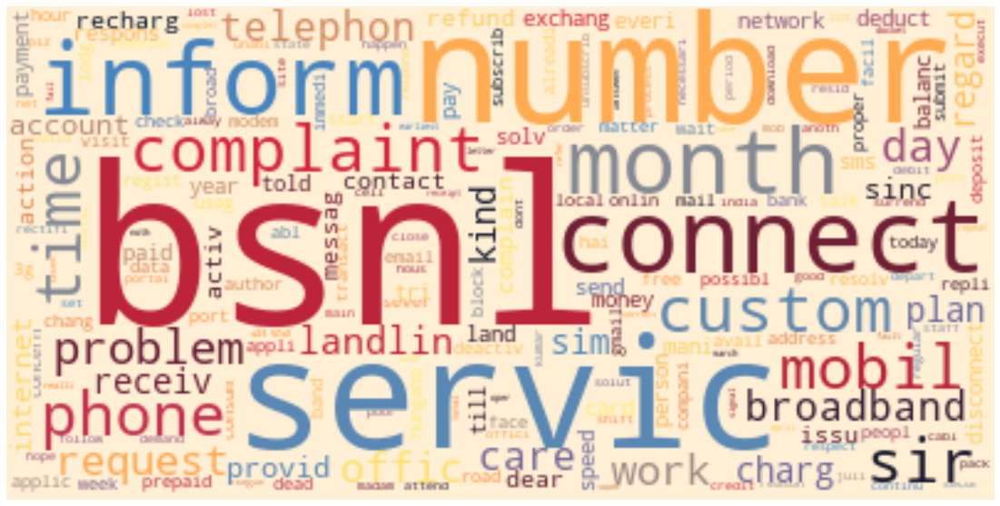

In [22]:
hero.wordcloud(df['cleaned_complaint_body'].pipe(hero.clean))

# **Topic Modeling**

In this example, we will go through the main components of BERTopic and the steps necessary to create a strong topic model. 




Converting it to list before applying BERTopic

In [23]:
docs = df["cleaned_complaint_body"].tolist()

In [24]:
docs[0:10]

['hai iam  broad band servic sinc  half year  iam  regur problem connect connect labtop iam  complient  week  broad band complient 45pm   number contact oneha  respons final talk jto  salim  send person till today   stay hyderabad santosh nagar coloni hno    floor number  mobil    matter inform  ',
 'recharg rupe plan gb  day septemb octob  gb  day plan chang mid   custom care unabl answer paid money gb  day  jb main recharg kr liya   chang kais kiya ja sakta  inform  ',
 "time receiv channel renew sms send bsnl  mobil   servic '  thing initi  face  problem   deduct main balanc time   deduct  resolv issu asap inform  ",
 ' user  password invalid  type correct usag display   inform  ',
 ' myrna pereira number    programm free month howev  programm request deactiv programm  confirm phone inform  ',
 'sir hamara lendlin number  sachiv saraswti vidhaya mandir timarni  hamn bradband conect  rakha hai  vigat dino  bradband theek  nahi chal raha hai iski shikayat bhee ki  koi hal nahi nikal r

## Training

We start by instantiating BERTopic. We set language to `english` since our documents are in the English language. If you would like to use a multi-lingual model, please use `language="multilingual"` instead. 

We will also calculate the topic probabilities. However, this can slow down BERTopic significantly at large amounts of data (>100_000 documents). It is advised to turn this off if you want to speed up the model. 


In [25]:
from bertopic import BERTopic

In [26]:
topic_model = BERTopic(language="multilingual", calculate_probabilities=True, verbose=True)
topics, probs = topic_model.fit_transform(docs)

2021-06-18 14:26:02,130 - BERTopic - Transformed documents to Embeddings


2021-06-18 14:26:38,700 - BERTopic - Reduced dimensionality with UMAP
2021-06-18 14:26:48,763 - BERTopic - Clustered UMAP embeddings with HDBSCAN


**NOTE**: Use `language="multilingual"` to select a model that support 50+ languages.

## Extracting Topics
After fitting our model, we can start by looking at the results. Typically, we look at the most frequent topics first as they best represent the collection of documents. 

In [27]:
freq = topic_model.get_topic_info(); freq.head(5)

,Topic,Count,Name
0,-1,6149,-1_sms_deduct_disconnect_messag
1,0,1587,0_dead_land_repair_complain
2,1,623,1_speed_kbps_mbps_slow
3,2,605,2_deposit_refund_chequ_receipt
4,3,442,3_recharg_bank_debit_account


-1 refers to all outliers and should typically be ignored. Next, let's take a look at a frequent topic that were generated:

In [28]:
topic_model.get_topic(2)  # Select the most frequent topic

[('deposit', 0.04173052013413171),
 ('refund', 0.032674095529226184),
 ('chequ', 0.022988576890144243),
 ('receipt', 0.011515747701269652),
 ('disconnect', 0.011485650623881658),
 ('receiv', 0.008967612828855297),
 ('bank', 0.008030971091503507),
 ('account', 0.007846306271151387),
 ('return', 0.007187243175274484),
 ('payment', 0.00537593336069174)]

**NOTE**: BERTopic is stocastich which means that the topics might differ across runs. This is mostly due to the stocastisch nature of UMAP.

# **Visualization**
There are several visualization options available in BERTopic, namely the visualization of topics, probabilities and topics over time. Topic modeling is, to a certain extent, quite subjective. Visualizations help understand the topics that were created. 

## Visualize Topics
After having trained our `BERTopic` model, we can iteratively go through perhaps a hundred topic to get a good 
understanding of the topics that were extract. However, that takes quite some time and lacks a global representation. 
Instead, we can visualize the topics that were generated in a way very similar to 
[LDAvis](https://github.com/cpsievert/LDAvis):

In [29]:
topic_model.visualize_topics()

## Visualize Topic Probabilities

The variable `probabilities` that is returned from `transform()` or `fit_transform()` can 
be used to understand how confident BERTopic is that certain topics can be found in a document. 

To visualize the distributions, we simply call:

In [30]:
topic_model.visualize_distribution(probs[200], min_probability=0.015)

## Visualize Topic Hierarchy

The topics that were created can be hierarchically reduced. In order to understand the potential hierarchical structure of the topics, we can use scipy.cluster.hierarchy to create clusters and visualize how they relate to one another. This might help selecting an appropriate nr_topics when reducing the number of topics that you have created.

In [31]:
topic_model.visualize_hierarchy(top_n_topics=50)

## Visualize Terms

We can visualize the selected terms for a few topics by creating bar charts out of the c-TF-IDF scores for each topic representation. Insights can be gained from the relative c-TF-IDF scores between and within topics. Moreover, you can easily compare topic representations to each other.

In [32]:
topic_model.visualize_barchart(top_n_topics=10)

## Visualize Topic Similarity
Having generated topic embeddings, through both c-TF-IDF and embeddings, we can create a similarity matrix by simply applying cosine similarities through those topic embeddings. The result will be a matrix indicating how similar certain topics are to each other.

In [33]:
topic_model.visualize_heatmap(n_clusters=20, width=1000, height=1000)

## Visualize Term Score Decline
Topics are represented by a number of words starting with the best representative word. Each word is represented by a c-TF-IDF score. The higher the score, the more representative a word to the topic is. Since the topic words are sorted by their c-TF-IDF score, the scores slowly decline with each word that is added. At some point adding words to the topic representation only marginally increases the total c-TF-IDF score and would not be beneficial for its representation.

To visualize this effect, we can plot the c-TF-IDF scores for each topic by the term rank of each word. In other words, the position of the words (term rank), where the words with the highest c-TF-IDF score will have a rank of 1, will be put on the x-axis. Whereas the y-axis will be populated by the c-TF-IDF scores. The result is a visualization that shows you the decline of c-TF-IDF score when adding words to the topic representation. It allows you, using the elbow method, the select the best number of words in a topic.


In [34]:
topic_model.visualize_term_rank()

# **Topic Representation**
After having created the topic model, you might not be satisfied with some of the parameters you have chosen. Fortunately, BERTopic allows you to update the topics after they have been created. 

This allows for fine-tuning the model to your specifications and wishes. 

## Update Topics
When you have trained a model and viewed the topics and the words that represent them,
you might not be satisfied with the representation. Perhaps you forgot to remove
stopwords or you want to try out a different `n_gram_range`. We can use the function `update_topics` to update 
the topic representation with new parameters for `c-TF-IDF`: 


In [35]:
topic_model.update_topics(docs, topics, n_gram_range=(1, 2))

In [36]:
topic_model.get_topic(2)   # We select topic that we viewed before

[('deposit', 0.029834639198004564),
 ('refund', 0.02918126341605438),
 ('secur deposit', 0.015234912564086647),
 ('refund secur', 0.011982825386507669),
 ('receiv', 0.00956339832047971),
 ('refund deposit', 0.009238305907708078),
 ('deposit refund', 0.007653070038872306),
 ('receipt', 0.007485023746575884),
 ('receiv refund', 0.007227618169576834),
 ('bank', 0.005815163213051312)]

## Topic Reduction
We can also reduce the number of topics after having trained a BERTopic model. The advantage of doing so, 
is that you can decide the number of topics after knowing how many are actually created. It is difficult to 
predict before training your model how many topics that are in your documents and how many will be extracted. 
Instead, we can decide afterwards how many topics seems realistic:





In [37]:
new_topics, new_probs = topic_model.reduce_topics(docs, topics, probs, nr_topics=60)

2021-06-18 14:31:33,826 - BERTopic - Reduced number of topics from 109 to 61


# **Search Topics**
After having trained our model, we can use `find_topics` to search for topics that are similar 
to an input search_term. Here, we are going to be searching for topics that closely relate the 
search term "vehicle". Then, we extract the most similar topic and check the results: 

In [38]:
similar_topics, similarity = topic_model.find_topics("network", top_n=5); similar_topics

[31, 44, 15, 47, 36]

In [39]:
topic_model.get_topic(42)

[('signal strength', 0.02978568627802189),
 ('weak', 0.021888319163425),
 ('signal problem', 0.016174714214960733),
 ('bsnl signal', 0.015472973276017604),
 ('proper signal', 0.01341952887878043),
 ('signal drop', 0.01341952887878043),
 ('3g signal', 0.012821647407054292),
 ('signal weak', 0.010995845189229221),
 ('bsnl 3g', 0.010421153090601947),
 ('signal area', 0.009076638613583592)]

# **Model serialization**
The model and its internal settings can easily be saved. Note that the documents and embeddings will not be saved. However, UMAP and HDBSCAN will be saved. 

In [ ]:
# Save model
topic_model.save("my_model")	

In [ ]:
# Load model
my_model = BERTopic.load("my_model")	